# U-net model initial training

We train classic U-net model on a Dataset A:

AI4Boundaries

https://doi.org/10.5194/essd-15-317-2023

License: Creative Commons Attribution 4.0 International (CC BY 4.0)

## Mount Google Drive
Because dataset is big and takes time to download it, I mount my Google Drive with presaved dataser archive (/content/drive/MyDrive/dissertation/datasets/orthos.zip).


In [1]:
from google.colab import drive
drive.mount("/content/drive")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [2]:
!ls -la /content/drive/MyDrive/dissertation/datasets/

total 8246072
-rw------- 1 root root  340216752 May 11 18:59 cyclegan_checkpoints_v2.weights.h5
-rw------- 1 root root  340216752 May 10 20:17 cyclegan_checkpoints.weights.h5
-rw------- 1 root root  340216752 May 10 20:59 cyclegan_checkpoints.weights.v2.h5
-rw------- 1 root root  332723447 May 11 17:26 dataseta2.tar.gz
-rw------- 1 root root  191213337 May 10 18:12 dataseta.tar.gz
-rw------- 1 root root  320580182 May 11 17:48 dataseta.v2.tar.gz
-rw------- 1 root root  106589230 May 10 18:54 datasetb.tar.gz
-rw------- 1 root root  150727497 May 11 17:49 datasetb.v2.tar.gz
-rw------- 1 root root  139308205 May 11 20:05 finetuning_dataset.v2.tar.gz
-rw------- 1 root root  132842444 May 10 22:17 finetuninnd_dataset.tar.gz
-rw------- 1 root root 6049340023 Apr 30 20:06 orthos.zip


Or the initial download of the dataset from the source

In [ ]:
#!curl --output ./orthos.zip https://jeodpp.jrc.ec.europa.eu/ftp/jrc-opendata/DRLL/AI4BOUNDARIES/orthophoto/orthos.zip

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100 5769M  100 5769M    0     0  12.5M      0  0:07:39  0:07:39 --:--:-- 9813k


Copy dataset to instance filesystem

In [3]:
!cp /content/drive/MyDrive/dissertation/datasets/orthos.zip ./

In [4]:
!unzip orthos.zip

Streaming output truncated to the last 5000 lines.
  inflating: masks/train/FR_28239_ortholabel_1m_512.tif  
  inflating: masks/train/AT_5352_ortholabel_1m_512.tif  
  inflating: masks/train/AT_6756_ortholabel_1m_512.tif  
  inflating: masks/train/AT_5338_ortholabel_1m_512.tif  
  inflating: masks/train/FR_55133_ortholabel_1m_512.tif  
  inflating: masks/train/AT_10104_ortholabel_1m_512.tif  
  inflating: masks/train/SE_17734_ortholabel_1m_512.tif  
  inflating: masks/train/SE_14706_ortholabel_1m_512.tif  
  inflating: masks/train/SI_1151_ortholabel_1m_512.tif  
  inflating: masks/train/AT_8548_ortholabel_1m_512.tif  
  inflating: masks/train/AT_9008_ortholabel_1m_512.tif  
  inflating: masks/train/AT_10261_ortholabel_1m_512.tif  
  inflating: masks/train/FR_40445_ortholabel_1m_512.tif  
  inflating: masks/train/AT_7562_ortholabel_1m_512.tif  
  inflating: masks/train/FR_30758_ortholabel_1m_512.tif  
  inflating: masks/train/SE_8933_ortholabel_1m_512.tif  
  inflating: masks/train/SE_2

In [3]:
!ls -la ./images/train/ | head



total 4106536
drwxrwxr-x 2 root root 266240 Sep 30  2022 .
drwxrwxr-x 5 root root   4096 Sep 30  2022 ..
-rw-rw-r-- 1 root root 787590 Sep 19  2022 AT_10033_ortho_1m_512.tif
-rw-rw-r-- 1 root root 787590 Sep 19  2022 AT_10034_ortho_1m_512.tif
-rw-rw-r-- 1 root root 787590 Sep 19  2022 AT_10039_ortho_1m_512.tif
-rw-rw-r-- 1 root root 787590 Sep 19  2022 AT_10042_ortho_1m_512.tif
-rw-rw-r-- 1 root root 787590 Sep 19  2022 AT_10043_ortho_1m_512.tif
-rw-rw-r-- 1 root root 787590 Sep 19  2022 AT_10044_ortho_1m_512.tif
-rw-rw-r-- 1 root root 787590 Sep 19  2022 AT_10051_ortho_1m_512.tif


Install librares necessary to process tif images.

In [2]:
!pip install -U --force-reinstall tifffile imagecodecs numpy

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.0/62.0 kB 4.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 226.5/226.5 kB 20.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 45.6/45.6 MB 51.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.4/16.4 MB 116.6 MB/s eta 0:00:00
  Attempting uninstall: numpy
    Found existing installation: numpy 2.0.2
    Uninstalling numpy-2.0.2:
      Successfully uninstalled numpy-2.0.2
  Attempting uninstall: tifffile
    Found existing installation: tifffile 2025.5.10
    Uninstalling tifffile-2025.5.10:
      Successfully uninstalled tifffile-2025.5.10
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
numba 0.60.0 requires numpy<2.1,>=1.22, but you have numpy 2.2.5 which is incompatible.
tensorflow 2.18.0 requires numpy<2.1.0,>=1.26.0, but you have numpy 2.2.5 which is incompatible.


Loading of necessary libraries and checking of instance GPU.

In [3]:
# check GPU
gpu_info = !nvidia-smi
gpu_info = '\n'.join(gpu_info)
if gpu_info.find('failed') >= 0:
  print('Not connected to a GPU')
else:
  print(gpu_info)

import os

# import libs for processing images
import imageio
import imagecodecs
from PIL import Image

# import visualizations
import matplotlib.pyplot as plt

import numpy as np

# TF and co
import tensorflow as tf
from tensorflow.keras.layers import Input
from tensorflow.keras.layers import Conv2D
from tensorflow.keras.layers import MaxPooling2D
from tensorflow.keras.layers import Dropout
from tensorflow.keras.layers import BatchNormalization
from tensorflow.keras.layers import Conv2DTranspose
from tensorflow.keras.layers import concatenate
from tensorflow.keras.losses import binary_crossentropy


Sat May 17 12:22:46 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.54.15              Driver Version: 550.54.15      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  NVIDIA L4                      Off |   00000000:00:03.0 Off |                    0 |
| N/A   42C    P8             12W /   72W |       0MiB /  23034MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

## Initial loading of pictures into numpy array
Because pictures of dataset are tif files, and masks also have encoded color channel, we need load them correctly. Final shapes for loaded puctures should be:

1. **Images**: (512, 512, 3) uint8

2. **Masks**:Shape: (512, 512, 1) uint8

In [6]:
def LoadData (path1, path2):
    """
    Looks for relevant filenames in the shared path
    Returns 2 lists for original and masked files respectively

    """
    # Read the images folder like a list
    image_dataset = os.listdir(path1)
    mask_dataset = os.listdir(path2)

    # Make a list for images and masks filenames
    orig_img = []
    mask_img = []
    for file in image_dataset:
        orig_img.append(file)
    for file in mask_dataset:
        mask_img.append(file)

    # Sort the lists to get both of them in same order (the dataset has exactly the same name for images and corresponding masks)
    orig_img.sort()
    mask_img.sort()

    return orig_img, mask_img

import os
import tifffile
import numpy as np
import imagecodecs # Ensure imagecodecs is imported if using tifffile with compressed files

def LoadAndProcessData(image_dir, mask_dir, mask_channel_index=0, mask_dtype=np.uint8):
    """
    Loads original images and processes corresponding multi-channel masks
    for semantic segmentation from specified directories.

    Args:
        image_dir (str): Path to the directory containing original image files.
        mask_dir (str): Path to the directory containing multi-channel mask files.
        mask_channel_index (int): The index of the channel containing the
                                  semantic segmentation labels (e.g., 0 for
                                  AI4Boundaries 'vector label'). Defaults to 0.
        mask_dtype (numpy.dtype): The target integer data type for the final
                                  mask (e.g., np.uint8, np.int64). Defaults to np.uint8.

    Returns:
        tuple: A tuple containing two lists:
            - loaded_images (list): A list of loaded original images (NumPy arrays).
            - processed_masks (list): A list of loaded and processed single-channel
                                     integer masks (NumPy arrays).
    """
    try:
        # List and sort filenames to ensure matching pairs
        image_filenames = sorted(os.listdir(image_dir))
        mask_filenames = sorted(os.listdir(mask_dir))

        # Basic check for equal number of files
        if len(image_filenames) != len(mask_filenames):
            print(f"Warning: Mismatch in file count! Images: {len(image_filenames)}, Masks: {len(mask_filenames)}")
            # Depending on requirements, you might want to raise an error here

        print(f"Found {len(image_filenames)} potential image/mask pairs.")

        loaded_images = []
        processed_masks = []

        # Iterate through the pairs using zip for safety
        for img_fname, mask_fname in zip(image_filenames, mask_filenames):
            # Optional: More robust check if names should match exactly (excluding extension)
            img_base = os.path.splitext(img_fname)[0]
            mask_base = os.path.splitext(mask_fname)[0]
            #if img_base != mask_base:
            #    print(f"Warning: Filenames might not correspond? Skipping pair: '{img_fname}' and '{mask_fname}'")
            #    continue

            img_full_path = os.path.join(image_dir, img_fname)
            mask_full_path = os.path.join(mask_dir, mask_fname)

            try:
                # --- Load Original Image ---
                # Using tifffile assuming images might also be TIFFs.
                # If images are standard PNG/JPG, imageio might be slightly simpler,
                # but tifffile handles various TIFF types well.
                image_data = tifffile.imread(img_full_path)
                # Note: Add any necessary preprocessing for images here (e.g., normalization) later.

                # --- Load and Process Mask ---
                # 1. Read the full multi-channel mask data
                multi_channel_mask_data = tifffile.imread(mask_full_path)

                # 2. Select the relevant channel
                if multi_channel_mask_data.ndim == 3 and multi_channel_mask_data.shape[2] > mask_channel_index:
                    raw_mask = multi_channel_mask_data[:, :, mask_channel_index]
                elif multi_channel_mask_data.ndim == 2 and mask_channel_index == 0:
                    # Handle case where mask file might already be single channel
                    print(f"  Info: Mask '{mask_fname}' is already 2D, using as is.")
                    raw_mask = multi_channel_mask_data
                else:
                    # Error if dimensions/channel index are unexpected
                    print(f"Error: Mask '{mask_fname}' has unexpected shape {multi_channel_mask_data.shape} or invalid channel index {mask_channel_index}. Skipping pair.")
                    continue # Skip this image/mask pair

                # 3. Convert the extracted mask channel to the target integer format
                final_mask = raw_mask.astype(mask_dtype)

                # Append the successfully loaded data
                loaded_images.append(image_data)
                processed_masks.append(final_mask)

            except FileNotFoundError:
                print(f"Error: File not found for pair. Image: '{img_full_path}', Mask: '{mask_full_path}'. Skipping.")
            except Exception as e:
                # Catch other potential errors during file reading or processing
                print(f"Error processing pair: Image='{img_fname}', Mask='{mask_fname}'. Error: {e}. Skipping.")

    except FileNotFoundError as e:
        print(f"Error: Cannot access directory. Path: {e.filename}")
        return [], [] # Return empty lists if directories aren't found
    except Exception as e:
        print(f"An unexpected error occurred in LoadAndProcessData: {e}")
        return [], [] # Return empty lists on other unexpected errors

    print(f"Successfully loaded {len(loaded_images)} image/mask pairs.")
    return loaded_images, processed_masks


## Preprocessing

Function for resizing and normalizing images and masks. To keep segmentation correct, masks shoul be resised using Nearest Neighbor algorithm.

In [7]:
import numpy as np
from PIL import Image
import os

def PreprocessData(loaded_images, processed_masks, target_shape_img, target_shape_mask):
    # Pull the relevant dimensions for image and mask
    # number of images/masks
    m = len(loaded_images)
    if m == 0:
        print("Warning: No images/masks provided to PreprocessData.")
        return np.zeros((0, *target_shape_img), dtype=np.float32), np.zeros((0, *target_shape_mask), dtype=np.int32)

    i_h, i_w, i_c = target_shape_img   # target height, width, and channels of images
    m_h, m_w, m_c = target_shape_mask  # target height, width, and channels of masks

    if m_c != 1:
        print(f"Warning: target_shape_mask expects {m_c} channels, but semantic segmentation usually requires 1.")

    # Define X and Y as number of images along with shape of one image
    X = np.zeros((m, i_h, i_w, i_c), dtype=np.float32)
    y = np.zeros((m, m_h, m_w, m_c), dtype=np.int32) # Use int32 for masks

    # Process images and masks using enumerate to get index and data
    for index, (img_array, mask_array) in enumerate(zip(loaded_images, processed_masks)):
        try:
            # Process Images
            # 1. Convert NumPy array to PIL Image object
            # Ensure uint8 type for standard image modes
            if img_array.dtype != np.uint8:
                 # May need adjustment if input isn't uint8 (e.g., scale if float)
                 img_array = img_array.astype(np.uint8)
            pil_img = Image.fromarray(img_array)

            # 2. Ensure 3 channels (RGB)
            pil_img = pil_img.convert('RGB')

            # 3. Resize image
            pil_img_resized = pil_img.resize((i_w, i_h), Image.Resampling.LANCZOS)

            # 4. Convert resized PIL image back to NumPy array
            img_resized_array = np.array(pil_img_resized)

            # 5. Normalize image data to 0-1 range (use 255.0 for float division)
            X[index] = img_resized_array.astype(np.float32) / 255.0

            # Process Masks
            # 1. Convert NumPy mask array (should be HxW uint8) to PIL Image
            if mask_array.ndim != 2:
                print(f"Warning: Mask at index {index} has {mask_array.ndim} dims, expected 2. Trying first channel.")
                mask_array = mask_array[:, :, 0]
            if mask_array.dtype != np.uint8:
                mask_array = mask_array.astype(np.uint8)
            pil_mask = Image.fromarray(mask_array)
            # 2. Resize mask using NEAREST neighbor to preserve discrete class labels
            pil_mask_resized = pil_mask.resize((m_w, m_h), Image.Resampling.NEAREST)
            # 3. Convert resized PIL mask back to NumPy array
            mask_resized_array = np.array(pil_mask_resized) # Shape will be (m_h, m_w)
            # 4. Adjust mask labels if needed (e.g., make 0-based)
            adjusted_mask_array = mask_resized_array
            # 5. Add the channel dimension and ensure correct dtype (int32)
            y[index] = np.expand_dims(adjusted_mask_array, axis=-1).astype(np.int32)

        except Exception as e:
            print(f"Error processing data at index {index}: {e}. Skipping pair.")
            # You might want to handle this more gracefully, e.g., remove the corresponding X entry
            # For now, it will leave zeros in X[index] and y[index] if an error occurs here.

    print("Finished preprocessing.")
    return X, y

## Designing U-nett model

### 1. Encoder block

This block uses multiple convolution layers, max pool, relu activation to create an architecture for learning.

Dropout added for regularization to prevent overfitting.

The block returns the activation values for next layer along with a skip connection which will be used in the decoder
    

In [4]:
def EncoderMiniBlock(inputs, n_filters=32, dropout_prob=0.25, max_pooling=True):
    # Add 2 Conv Layers with relu activation and HeNormal initialization using TensorFlow
    # Proper initialization prevents from the problem of exploding and vanishing gradients
    # 'Same' padding will pad the input to conv layer such that the output has the same height and width (hence, is not reduced in size)
    conv = Conv2D(n_filters,
                  3,   # Kernel size
                  activation='relu',
                  padding='same',
                  kernel_initializer='HeNormal',
                 kernel_regularizer=tf.keras.regularizers.l2(1e-4))(inputs)
    conv = Conv2D(n_filters,
                  3,   # Kernel size
                  activation='relu',
                  padding='same',
                  kernel_initializer='HeNormal',
                  kernel_regularizer=tf.keras.regularizers.l2(1e-4))(conv)

    # Batch Normalization will normalize the output of the last layer based on the batch's mean and standard deviation
    conv = BatchNormalization()(conv, training=True)

    # In case of overfitting, dropout will regularize the loss and gradient computation to shrink the influence of weights on output
    if dropout_prob > 0:
        conv = tf.keras.layers.Dropout(dropout_prob)(conv)

    # Pooling reduces the size of the image while keeping the number of channels same
    # Pooling has been kept as optional as the last encoder layer does not use pooling (hence, makes the encoder block flexible to use)
    # Below, Max pooling considers the maximum of the input slice for output computation and uses stride of 2 to traverse across input image
    if max_pooling:
        next_layer = tf.keras.layers.MaxPooling2D(pool_size = (2,2))(conv)
    else:
        next_layer = conv

    # skip connection (without max pooling) will be input to the decoder layer to prevent information loss during transpose convolutions
    skip_connection = conv

    return next_layer, skip_connection

### 2. Decoder block

Decoder Block first uses transpose convolution to upscale the image to a bigger size and then, merges the result with skip layer results from encoder block

Adding 2 convolutions with 'same' padding helps further increase the depth of the network for better predictions

The function returns the decoded layer output

In [5]:
def DecoderMiniBlock(prev_layer_input, skip_layer_input, n_filters=32):
    # Start with a transposre convoltion layer to first increase the size of the image
    up = Conv2DTranspose(
                 n_filters,
                 (3,3),    # Kernel size
                 strides=(2,2),
                 padding='same')(prev_layer_input)

    # Merge the skip connection from previous block to prevent information loss
    merge = concatenate([up, skip_layer_input], axis=3)

    # Add 2 Conv Layers with relu activation and HeNormal initialization for further processing
    # The parameters for the function are similar to encoder
    conv = Conv2D(n_filters,
                 3,     # Kernel size
                 activation='relu',
                 padding='same',
                 kernel_initializer='HeNormal')(merge)
    conv = Conv2D(n_filters,
                 3,   # Kernel size
                 activation='relu',
                 padding='same',
                 kernel_initializer='HeNormal')(conv)
    return conv

### 3. Building model architecture from prepaed blocks

Combine both encder and decoder blocks according to the U-Net research paper

Return the model as output

In [6]:
def UNetCompiled(input_size=(256, 256, 3), n_filters=32):
    # Input size represent the size of 1 image (the size used for pre-processing)
    inputs = Input(input_size)

    # Encoder includes multiple convolutional mini blocks with different maxpooling, dropout and filter parameters
    # Observe that the filters are increasing as we go deeper into the network which will increasse the # channels of the image
    cblock1 = EncoderMiniBlock(inputs, n_filters,dropout_prob=0, max_pooling=True)
    cblock2 = EncoderMiniBlock(cblock1[0],n_filters*2,dropout_prob=0, max_pooling=True)
    cblock3 = EncoderMiniBlock(cblock2[0], n_filters*4,dropout_prob=0, max_pooling=True)
    cblock4 = EncoderMiniBlock(cblock3[0], n_filters*8,dropout_prob=0.3, max_pooling=True)
    cblock5 = EncoderMiniBlock(cblock4[0], n_filters*16, dropout_prob=0.3, max_pooling=False)

    # Decoder includes multiple mini blocks with decreasing number of filters
    # Observe the skip connections from the encoder are given as input to the decoder
    # Recall the 2nd output of encoder block was skip connection, hence cblockn[1] is used
    ublock6 = DecoderMiniBlock(cblock5[0], cblock4[1],  n_filters * 8)
    ublock7 = DecoderMiniBlock(ublock6, cblock3[1],  n_filters * 4)
    ublock8 = DecoderMiniBlock(ublock7, cblock2[1],  n_filters * 2)
    ublock9 = DecoderMiniBlock(ublock8, cblock1[1],  n_filters)

    # Complete the model with 1 3x3 convolution layer (Same as the prev Conv Layers)
    # Followed by a 1x1 Conv layer to get the image to the desired size.
    # Observe the number of channels will be equal to number of output classes
    conv9 = Conv2D(n_filters,
                 3,
                 activation='relu',
                 padding='same',
                 kernel_initializer='he_normal')(ublock9)

    conv10 = Conv2D(2, 1, padding='same', activation="softmax")(conv9)

    model = tf.keras.Model(inputs=inputs, outputs=conv10)

    return model

## Loading and showing dataset examples: picture and mask


Found 5319 potential image/mask pairs.
Successfully loaded 5319 image/mask pairs.

Displaying 5 example(s):

Image 0:
  Shape: (512, 512, 3), dtype: uint8
Mask 0:
  Shape: (512, 512), dtype: uint8
  Unique mask values: [0]


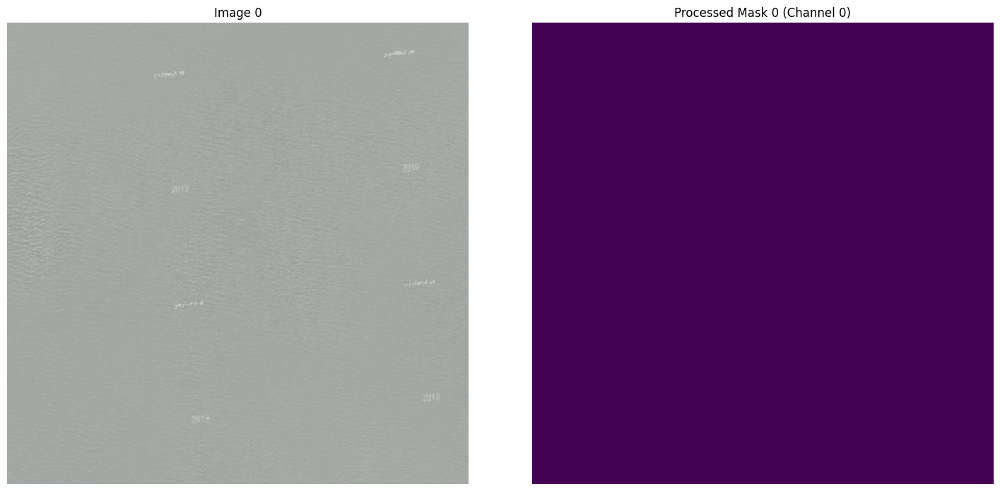


Image 1:
  Shape: (512, 512, 3), dtype: uint8
Mask 1:
  Shape: (512, 512), dtype: uint8
  Unique mask values: [0]


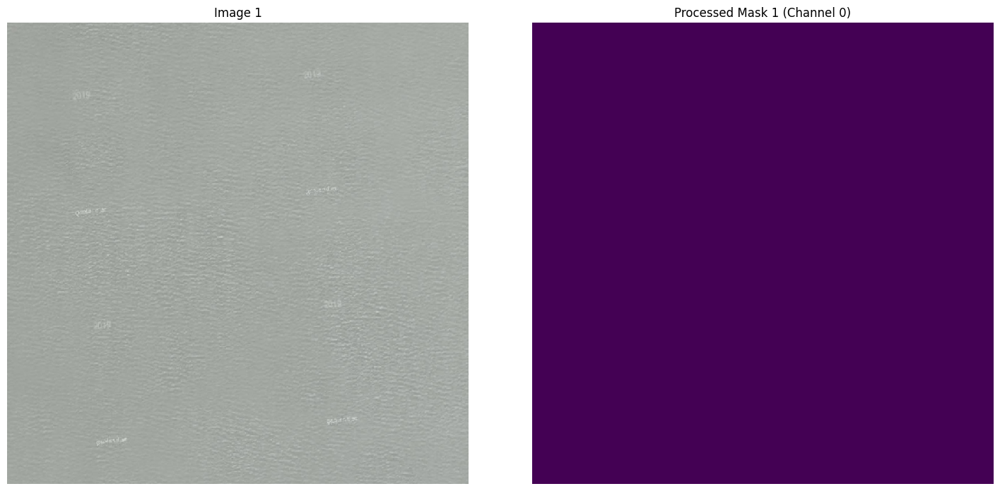


Image 2:
  Shape: (512, 512, 3), dtype: uint8
Mask 2:
  Shape: (512, 512), dtype: uint8
  Unique mask values: [0 1]


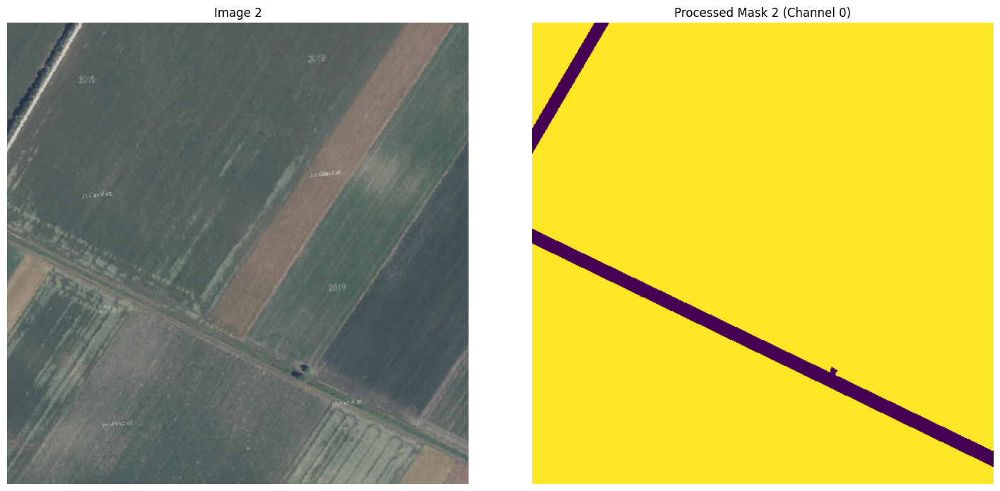


Image 3:
  Shape: (512, 512, 3), dtype: uint8
Mask 3:
  Shape: (512, 512), dtype: uint8
  Unique mask values: [0 1]


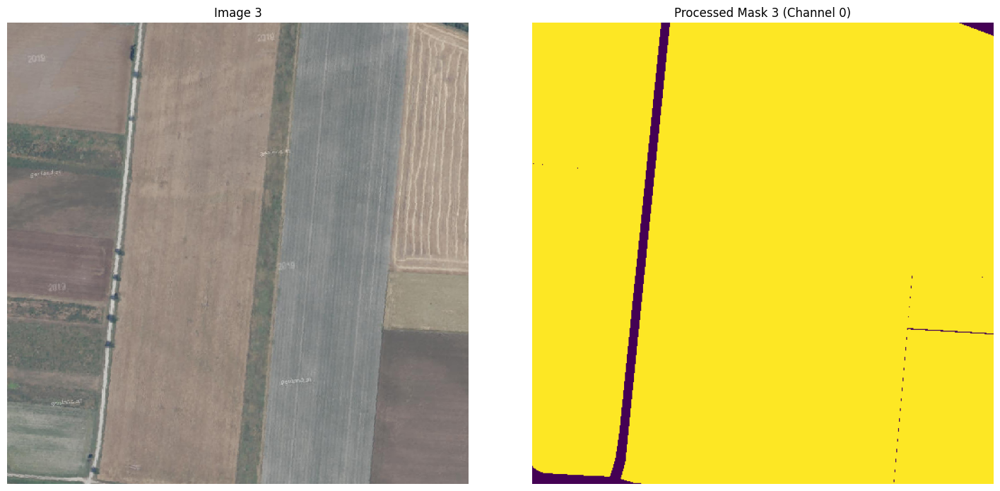


Image 4:
  Shape: (512, 512, 3), dtype: uint8
Mask 4:
  Shape: (512, 512), dtype: uint8
  Unique mask values: [0 1]


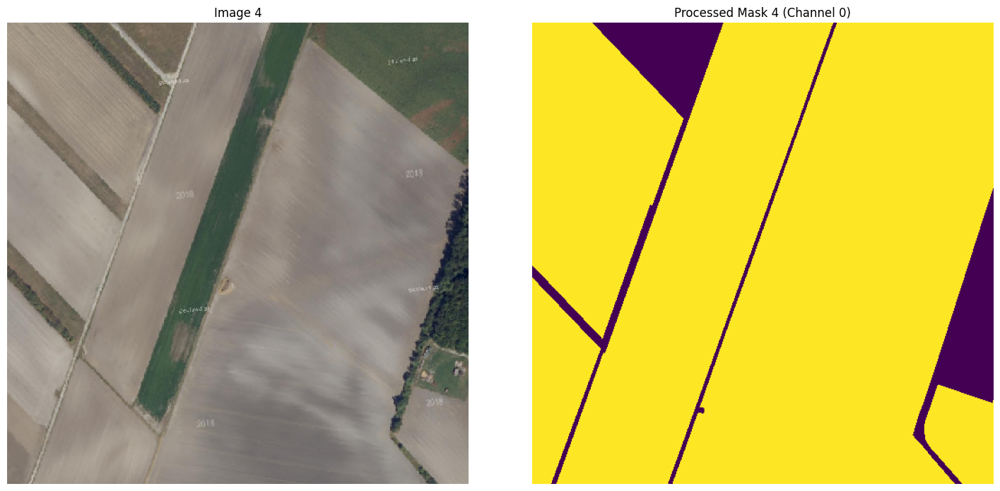

In [11]:
import os
import matplotlib.pyplot as plt
import numpy as np
import tifffile
import imagecodecs

# dataset paths
IMAGE_TRAIN_PATH = './images/train/'
MASK_TRAIN_PATH = './masks/train/'


if os.path.exists(IMAGE_TRAIN_PATH) and os.path.exists(MASK_TRAIN_PATH):
    img, mask = LoadAndProcessData(IMAGE_TRAIN_PATH, MASK_TRAIN_PATH, mask_channel_index=0, mask_dtype=np.uint8)
else:
    print(f"Error: Training directories not found at '{IMAGE_TRAIN_PATH}' or '{MASK_TRAIN_PATH}'")
    img, mask = [], []

# Check if loading was successful and data exists
if img and mask:
    # View an example of image and corresponding mask
    show_images = min(5, len(img)) # Show up to 2 images, or fewer if less data loaded
    print(f"\nDisplaying {show_images} example(s):")
    for i in range(show_images):

        img_view = img[i]
        mask_view = mask[i]

        print(f"\nImage {i}:")
        print(f"  Shape: {img_view.shape}, dtype: {img_view.dtype}")
        print(f"Mask {i}:")
        print(f"  Shape: {mask_view.shape}, dtype: {mask_view.dtype}")
        print(f"  Unique mask values: {np.unique(mask_view)}")

        # Plot
        fig, arr = plt.subplots(1, 2, figsize=(15, 7)) # Adjusted figsize for better layout

        # Display image
        arr[0].imshow(img_view)
        arr[0].set_title(f'Image {i}')
        arr[0].axis('off') # Hide axes ticks

        # Display mask
        arr[1].imshow(mask_view, cmap='viridis') # Or cmap='gray'
        arr[1].set_title(f'Processed Mask {i} (Channel 0)')
        arr[1].axis('off') # Hide axes ticks

        plt.tight_layout()
        plt.show()
else:
    print("\nNo data loaded.")

### Resize pictures and prepare train dataset

Finished preprocessing.

Class distribution in y_train (after resizing):
  Class 0: 215588806 pixels (61.85%)
  Class 1: 132997178 pixels (38.15%)

Processed Shapes:
X_train Shape: (5319, 256, 256, 3)
y_train shape: (5319, 256, 256, 1)

Visualizing processed example index 4:


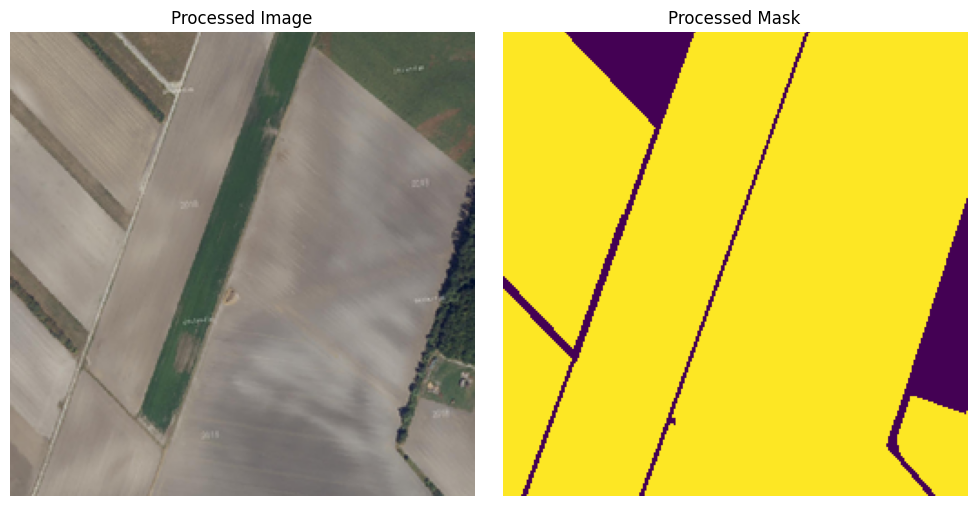

In [12]:
# Define shape (height, widh, channels)
target_shape_img = [256, 256, 3]
target_shape_mask = [256, 256, 1]

if 'img' in locals() and 'mask' in locals() and img and mask:

    X_train, y_train = PreprocessData(img, mask, target_shape_img, target_shape_mask)


    if X_train.size > 0 and y_train.size > 0 :
        total_pixels = y_train.size
        unique_classes, counts = np.unique(y_train, return_counts=True)
        print("\nClass distribution in y_train (after resizing):")
        for cls, count in zip(unique_classes, counts):
            percentage = (count / total_pixels) * 100
            print(f"  Class {cls}: {count} pixels ({percentage:.2f}%)")

        #shape of output
        print("\nProcessed Shapes:")
        print("X_train Shape:", X_train.shape)
        print("y_train shape:", y_train.shape)

        # visualize the output
        image_index = 4 # Visualize the first processed image/mask
        print(f"\nVisualizing processed example index {image_index}:")
        fig, arr = plt.subplots(1, 2, figsize=(10, 5))


        arr[0].imshow(X_train[image_index])
        arr[0].set_title('Processed Image')
        arr[0].axis('off')

        #colormap for masks
        arr[1].imshow(np.squeeze(y_train[image_index]), cmap='viridis')
        arr[1].set_title('Processed Mask')
        arr[1].axis('off')

        plt.tight_layout()
        plt.show()
    else:
        print("\nPreprocessing resulted in empty arrays.")
else:
    print("\nVariables 'img' and 'mask' not found or are empty.")

In [13]:
print(np.unique(y_train)) #check if mask is correct

[0 1]


## Prepare validation dataset and show examples

Loading data using LoadAndProcessData...
Found 1140 potential image/mask pairs.
Successfully loaded 1140 image/mask pairs.

Displaying 5 example(s):

Image 0:
  Shape: (512, 512, 3), dtype: uint8
Mask 0:
  Shape: (512, 512), dtype: uint8
  Unique mask values: [0]


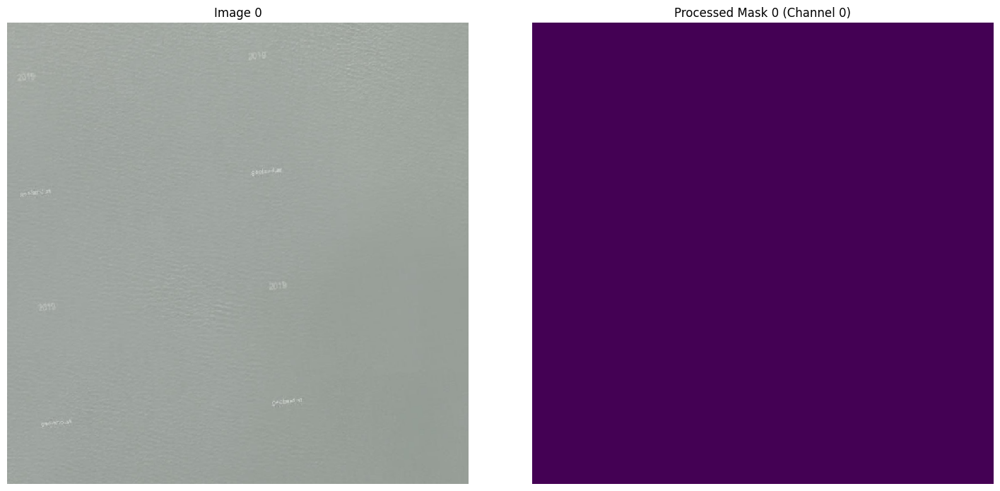


Image 1:
  Shape: (512, 512, 3), dtype: uint8
Mask 1:
  Shape: (512, 512), dtype: uint8
  Unique mask values: [0 1]


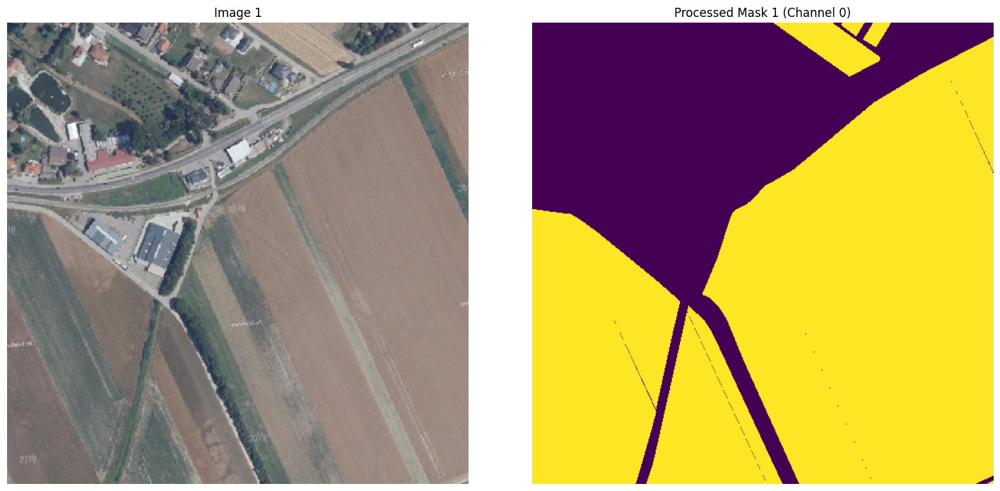


Image 2:
  Shape: (512, 512, 3), dtype: uint8
Mask 2:
  Shape: (512, 512), dtype: uint8
  Unique mask values: [0 1]


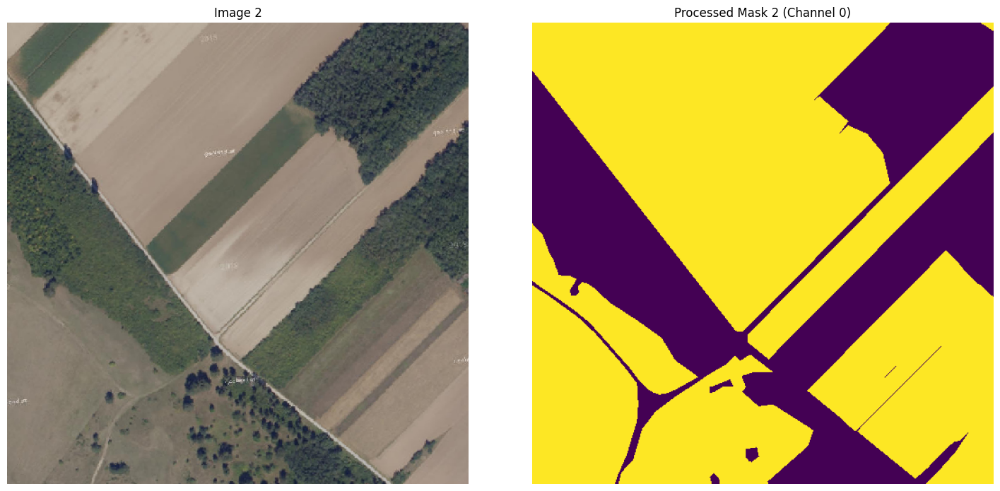


Image 3:
  Shape: (512, 512, 3), dtype: uint8
Mask 3:
  Shape: (512, 512), dtype: uint8
  Unique mask values: [0 1]


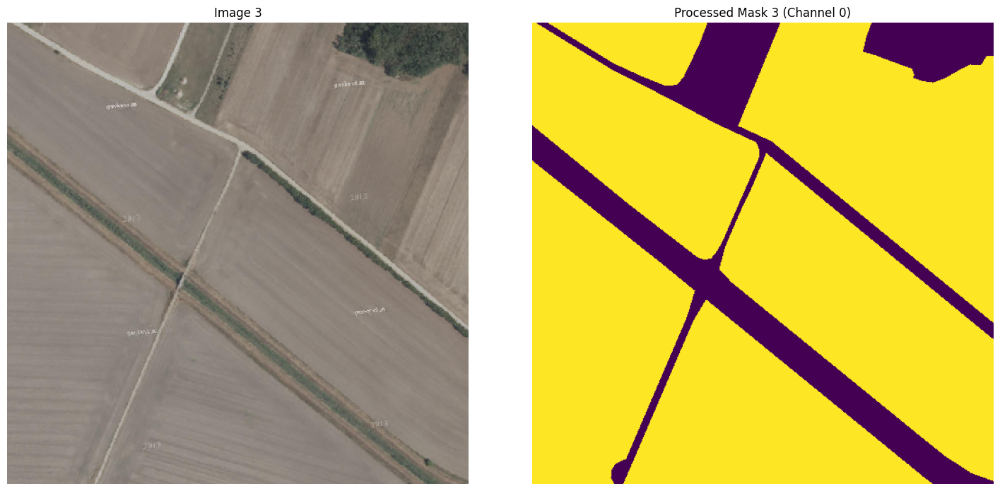


Image 4:
  Shape: (512, 512, 3), dtype: uint8
Mask 4:
  Shape: (512, 512), dtype: uint8
  Unique mask values: [0 1]


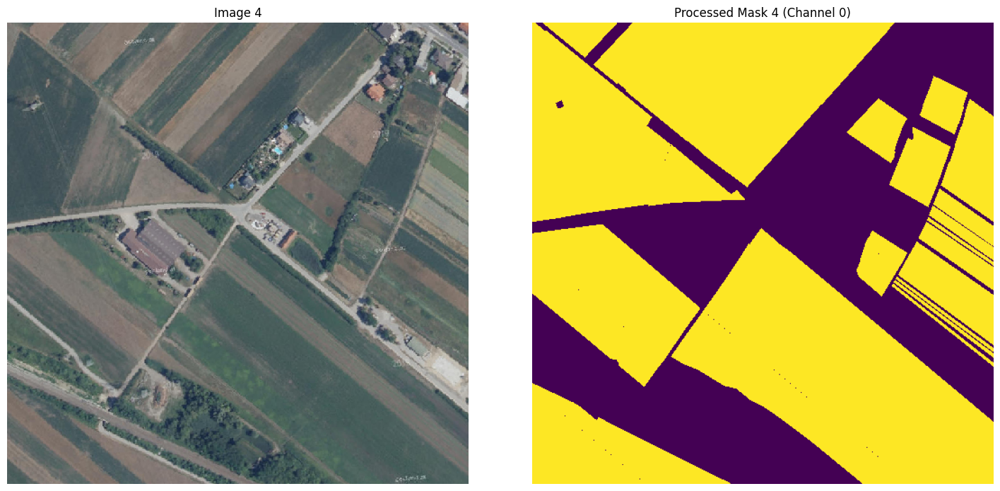

In [14]:
""" Load Validation Set and view some examples """

IMAGE_TRAIN_PATH = './images/val'
MASK_TRAIN_PATH = './masks/val'


if os.path.exists(IMAGE_TRAIN_PATH) and os.path.exists(MASK_TRAIN_PATH):
    print("Loading data using LoadAndProcessData...")

    img_val, mask_val = LoadAndProcessData(IMAGE_TRAIN_PATH, MASK_TRAIN_PATH, mask_channel_index=0, mask_dtype=np.uint8)
else:
    print(f"Error: Training directories not found at '{IMAGE_TRAIN_PATH}' or '{MASK_TRAIN_PATH}'")
    img_val, mask_val = [], []


if img_val and mask_val:

    show_images = min(5, len(img_val))
    print(f"\nDisplaying {show_images} example(s):")
    for i in range(show_images):

        img_view = img_val[i]
        mask_view = mask_val[i]

        print(f"\nImage {i}:")
        print(f"  Shape: {img_view.shape}, dtype: {img_view.dtype}")
        print(f"Mask {i}:")
        print(f"  Shape: {mask_view.shape}, dtype: {mask_view.dtype}")
        print(f"  Unique mask values: {np.unique(mask_view)}")

        # plot
        fig, arr = plt.subplots(1, 2, figsize=(15, 7))

        # display image
        arr[0].imshow(img_view)
        arr[0].set_title(f'Image {i}')
        arr[0].axis('off')

        # Display mask
        arr[1].imshow(mask_view, cmap='viridis') # Or cmap='gray'
        arr[1].set_title(f'Processed Mask {i} (Channel 0)')
        arr[1].axis('off')

        plt.tight_layout()
        plt.show()
else:
    print("\nNo data loaded, skipping display.")

## Preprocess validation data

Finished preprocessing.

Class distribution in y_val (after resizing):
  Class 0: 215588806 pixels (288.56%)
  Class 1: 132997178 pixels (178.02%)

Processed Shapes:
y_val Shape: (1140, 256, 256, 1)
y_val shape: (1140, 256, 256, 1)

Visualizing processed example index 5:


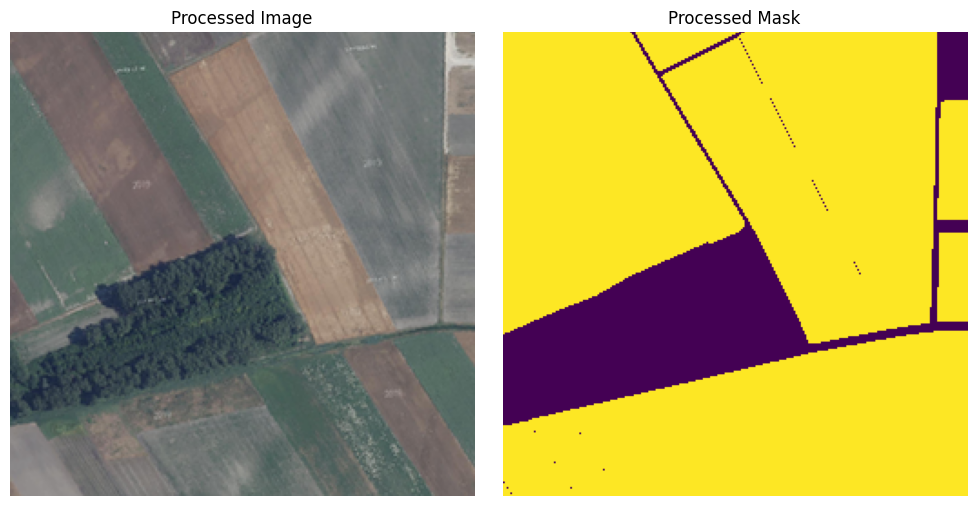

In [15]:
# shape (height, cidth, channels), we use 256x256
target_shape_img = [256, 256, 3]
target_shape_mask = [256, 256, 1]

if 'img_val' in locals() and 'mask_val' in locals() and img_val and mask_val:

    X_val, y_val = PreprocessData(img_val, mask_val, target_shape_img, target_shape_mask)

    #Visualization
    if X_val.size > 0 and y_val.size > 0 :
        total_pixels = y_val.size
        unique_classes, counts = np.unique(y_train, return_counts=True)
        print("\nClass distribution in y_val (after resizing):")
        for cls, count in zip(unique_classes, counts):
            percentage = (count / total_pixels) * 100
            print(f"  Class {cls}: {count} pixels ({percentage:.2f}%)")


        print("\nProcessed Shapes:")
        print("y_val Shape:", y_val.shape)
        print("y_val shape:", y_val.shape)


        image_index = 5
        print(f"\nVisualizing processed example index {image_index}:")
        fig, arr = plt.subplots(1, 2, figsize=(10, 5))


        arr[0].imshow(X_val[image_index])
        arr[0].set_title('Processed Image')
        arr[0].axis('off')


        arr[1].imshow(np.squeeze(y_val[image_index]), cmap='viridis')
        arr[1].set_title('Processed Mask')
        arr[1].axis('off')

        plt.tight_layout()
        plt.show()
    else:
        print("\nPreprocessing resulted in empty arrays. Check logs for errors.")
else:
    print("\nVariables 'img' and 'mask' not found or are empty. Run LoadAndProcessData first.")

In [22]:
y_val.dtype

dtype('int32')

## Metrics

In order to evaluate model correctly we need to add three important metrics

### 1. Intersection over Union (IoU) / Mean IoU (mIoU)
IoU is the ratio between the area of overlap and the area of union between the predicted segmentation and the ground truth for a given class.

It focuses on overlap quality and provides a direct measure of how well the predicted mask overlaps with the actual object.

Also, mIoU, the mean over all classes, helps fairly evaluate classes that may have fewer pixels.

Moreover, it is an industry standard. mIoU is a benchmark metric in segmentation challenges (e.g., Pascal VOC, COCO), making it suitable for comparing models


### 2. Pixel Accuracy
The proportion of correctly classified pixels over the total number of pixels:

Why it's important:

Simple and intuitive: It gives a general sense of the model’s performance.

Limitations:
Insensitive to class imbalance, it can be misleading in cases where one class (like background) dominates, and the model performs poorly on smaller, important regions.


### 3. F1 Score
The F1 score balances precision and recall for each class. It is equivalent to the Dice coefficient in segmentation.

It balances false positives and false negatives. It is valuable when under- or over-segmentation are critical.

Also F1 sensitive to segmentation errors, it helps evaluate the consistency of predictions on object boundaries.

In [177]:

class SegF1(tf.keras.metrics.Metric):
    def __init__(self, name="macro_f1", **kw):
        super().__init__(name=name, **kw)
        self.f1 = tf.keras.metrics.F1Score(average="macro", threshold=None)

    def update_state(self, y_true, y_pred, sample_weight=None):
        # flatten to (N,) then expand to (N,1) → now 2-D
        y_true = tf.reshape(y_true, [-1, 1])
        y_pred = tf.reshape(tf.argmax(y_pred, -1), [-1, 1])
        self.f1.update_state(y_true, y_pred, sample_weight)

    def result(self):       return self.f1.result()
    def reset_states(self): self.f1.reset_states()



## Prepare to trainig

init model

In [7]:
with tf.device('/device:GPU:0'):
  unet = UNetCompiled(input_size=(256,256,3), n_filters=32)

In [11]:
unet.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, 256, 256,  │        896 │ input_layer[0][0] │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_1 (Conv2D)   │ (None, 256, 256,  │      9,248 │ conv2d[0][0]      │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalization │ (None, 256, 256,  │        128 │ conv2d_1[0][0]    │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d       │ (None, 128, 128,  │          0 │ batch_normalizat… │
│ (MaxPooling2D)      │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_2 (Conv2D)   │ (None, 128, 128,  │     18,496 │ max_pooling2d[0]… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_3 (Conv2D)   │ (None, 128, 128,  │     36,928 │ conv2d_2[0][0]    │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 128, 128,  │        256 │ conv2d_3[0][0]    │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_1     │ (None, 64, 64,    │          0 │ batch_normalizat… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_4 (Conv2D)   │ (None, 64, 64,    │     73,856 │ max_pooling2d_1[… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_5 (Conv2D)   │ (None, 64, 64,    │    147,584 │ conv2d_4[0][0]    │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 64, 64,    │        512 │ conv2d_5[0][0]    │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_2     │ (None, 32, 32,    │          0 │ batch_normalizat… │
│ (MaxPooling2D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_6 (Conv2D)   │ (None, 32, 32,    │    295,168 │ max_pooling2d_2[… │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_7 (Conv2D)   │ (None, 32, 32,    │    590,080 │ conv2d_6[0][0]    │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32, 32,    │      1,024 │ conv2d_7[0][0]    │
│ (BatchNormalizatio… │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout (Dropout)   │ (None, 32, 32,    │          0 │ batch_normalizat

 Total params: 8,643,746 (32.97 MB)

 Trainable params: 8,641,762 (32.97 MB)

 Non-trainable params: 1,984 (7.75 KB)

## Make mutable learning rate

I tried to train the model several times, and have found that training and validation loss usually unstable. Model either shows good start, but than learning degrades, or it shows highly volatile loss at start but than becomes smooth.

I have found solution - mutable learning rate.

In [179]:
tf.keras.backend.clear_session()

initial_lr = 0.001
reduce_lr_callback = tf.keras.callbacks.ReduceLROnPlateau(
    monitor='val_loss',  # monitor validation loss to determine when to change learning rate
    factor=0.2,          # factor by whic the learning rate will be reduced new_lr = lr * factor
    patience=3,          # number of epochs with no improvement after which learning rate will be reduced.
    min_lr=1e-6,         # lower bound on the learning rate.
    verbose=1,           # print messages when reducing LR
    mode='min'           # 'min' because we want loss to decrease
)

class LearningRateLogger(tf.keras.callbacks.Callback):
    def on_epoch_begin(self, epoch, logs=None):
        current_lr = tf.keras.backend.get_value(self.model.optimizer.learning_rate)
        print(f"Epoch {epoch+1}: Learning rate is {current_lr:.7f}.")
    def __init__(self):
        super().__init__()
        self.epoch_lrs = []
    def on_epoch_end(self, epoch, logs=None):
        current_lr = tf.keras.backend.get_value(self.model.optimizer.learning_rate)
        self.epoch_lrs.append(current_lr)

lr_logger = LearningRateLogger()

# when everything ready, compile the model
with tf.device('/device:GPU:0'):
  unet.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=initial_lr),
               loss=tf.keras.losses.SparseCategoricalCrossentropy(),
               metrics=[
                   "accuracy",
                   tf.keras.metrics.IoU(
                      num_classes=2,
                      target_class_ids=[1],
                      sparse_y_true=True,
                      sparse_y_pred=False,
                      name="crop_iou"),
                   SegF1()
              ])

## Training

In [173]:
with tf.device('/device:GPU:0'):
  results = unet.fit(
      X_train,
      y_train,
      batch_size=8,
      epochs=1,
      validation_data=(X_val, y_val),
      callbacks=[reduce_lr_callback, lr_logger]
      )

Epoch 1: Learning rate is 0.0010000.
665/665 ━━━━━━━━━━━━━━━━━━━━ 91s 109ms/step - accuracy: 0.7773 - crop_iou: 0.5312 - loss: 0.6128 - macro_f1: 0.6927 - val_accuracy: 0.7033 - val_crop_iou: 0.5484 - val_loss: 0.6376 - val_macro_f1: 0.7083 - learning_rate: 0.0010


In [135]:
print(results.history.keys())

dict_keys(['accuracy', 'crop_iou', 'loss', 'macro_f1', 'val_accuracy', 'val_crop_iou', 'val_loss', 'val_macro_f1', 'learning_rate'])


In [136]:
for k, v in results.history.items():
    print(f"{k:15s}  first:{v[0]:.4f}   last:{v[-1]:.4f}")

accuracy         first:0.8126   last:0.8836
crop_iou         first:0.5987   last:0.7292
loss             first:0.4997   last:0.3086
macro_f1         first:0.7490   last:0.8434
val_accuracy     first:0.8326   last:0.8789
val_crop_iou     first:0.6506   last:0.7299
val_loss         first:0.4522   last:0.3158
val_macro_f1     first:0.7883   last:0.8439
learning_rate    first:0.0010   last:0.0000


## Check trainng progression

Progression of loss and accuracy is acceptable

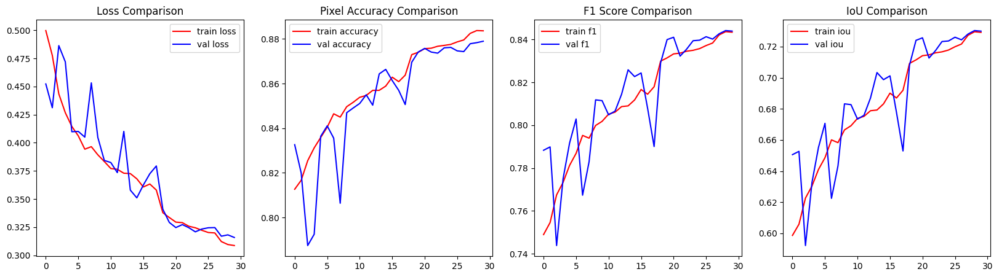

In [137]:
import matplotlib.pyplot as plt
fig, axis = plt.subplots(1, 4, figsize=(20, 5))
axis[0].plot(results.history["loss"], color='r', label = 'train loss')
axis[0].plot(results.history["val_loss"], color='b', label = 'val loss')
axis[0].set_title('Loss Comparison')
axis[0].legend()
axis[1].plot(results.history["accuracy"], color='r', label = 'train accuracy')
axis[1].plot(results.history["val_accuracy"], color='b', label = 'val accuracy')
axis[1].set_title('Pixel Accuracy Comparison')
axis[1].legend()
axis[2].plot(results.history["macro_f1"], color='r', label = 'train f1')
axis[2].plot(results.history["val_macro_f1"], color='b', label = 'val f1')
axis[2].set_title('F1 Score Comparison')
axis[2].legend()
axis[3].plot(results.history["crop_iou"], color='r', label = 'train iou')
axis[3].plot(results.history["val_crop_iou"], color='b', label = 'val iou')
axis[3].set_title('IoU Comparison')
axis[3].legend()

## Evaluation of trained model

Prepare test dataset

Loading data using LoadAndProcessData...
Found 1139 potential image/mask pairs.
Error processing pair: Image='SI_534_ortho_1m_512.tif', Mask='SI_489_ortholabel_1m_512.tif.aux.xml'. Error: not a TIFF file b'<PAM'. Skipping.
Successfully loaded 1138 image/mask pairs.

Displaying 5 example(s):

Image 0:
  Shape: (512, 512, 3), dtype: uint8
Mask 0:
  Shape: (512, 512), dtype: uint8
  Unique mask values: [0 1]


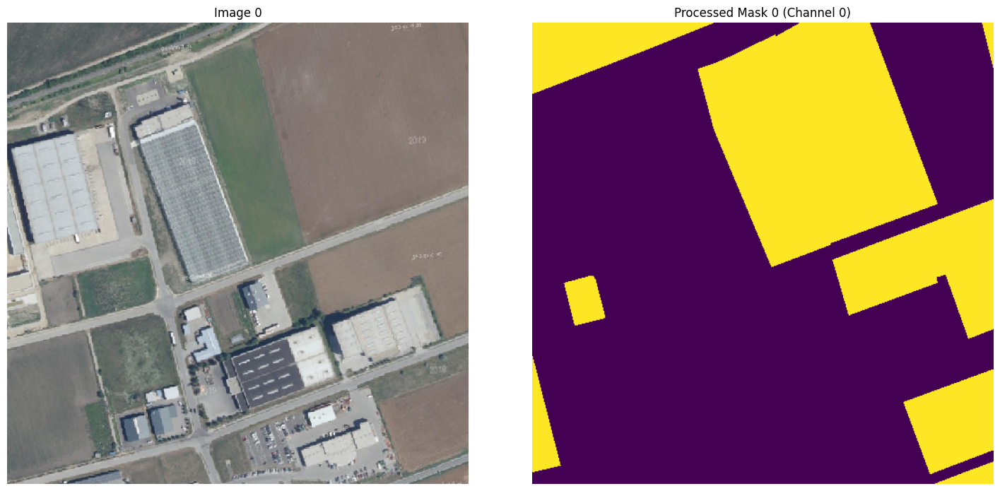


Image 1:
  Shape: (512, 512, 3), dtype: uint8
Mask 1:
  Shape: (512, 512), dtype: uint8
  Unique mask values: [0 1]


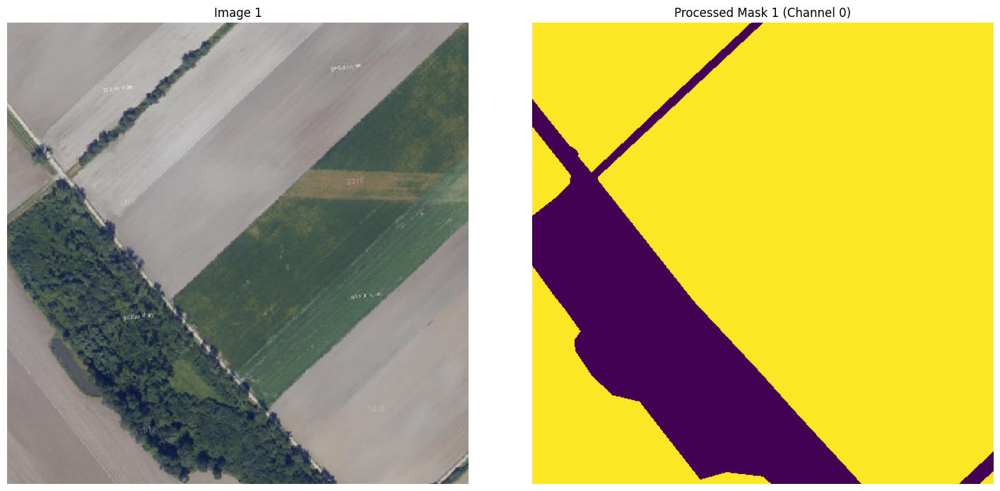


Image 2:
  Shape: (512, 512, 3), dtype: uint8
Mask 2:
  Shape: (512, 512), dtype: uint8
  Unique mask values: [0 1]


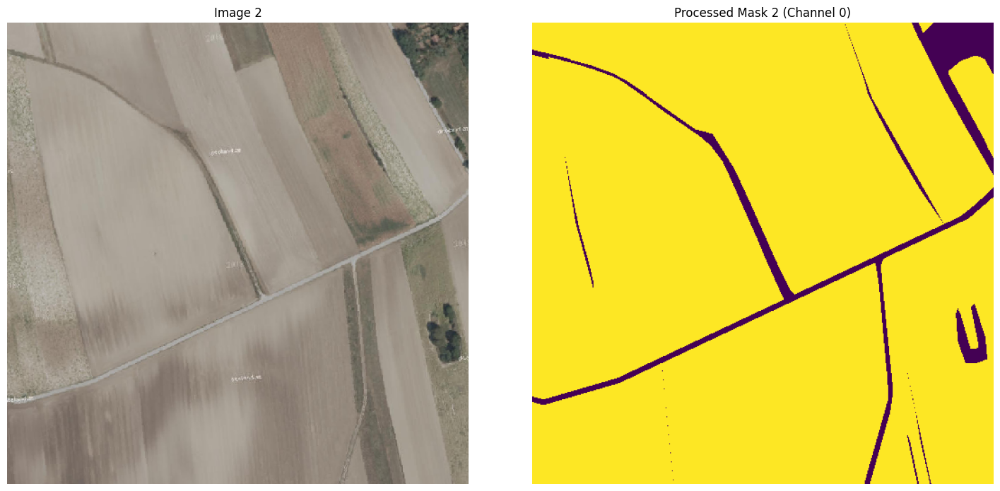


Image 3:
  Shape: (512, 512, 3), dtype: uint8
Mask 3:
  Shape: (512, 512), dtype: uint8
  Unique mask values: [0 1]


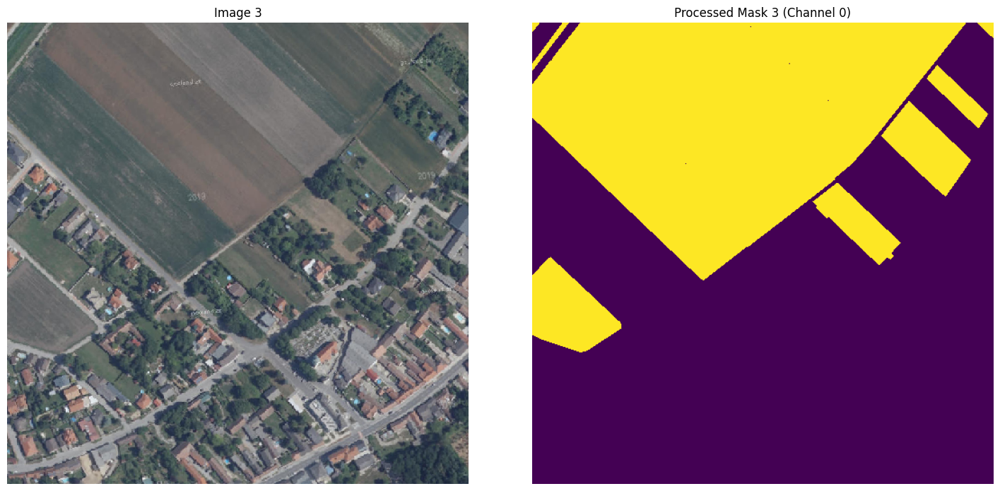


Image 4:
  Shape: (512, 512, 3), dtype: uint8
Mask 4:
  Shape: (512, 512), dtype: uint8
  Unique mask values: [0 1]


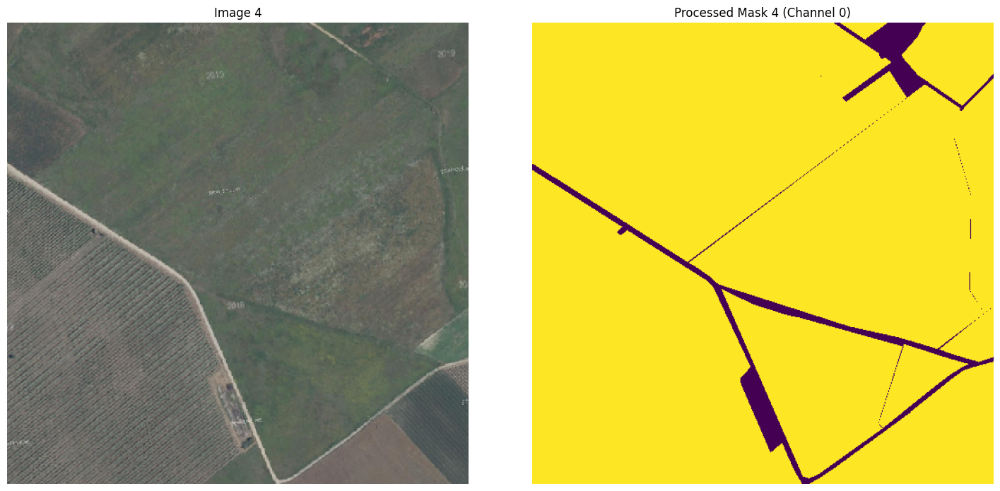

In [143]:
#prepare test dataset part

IMAGE_TRAIN_PATH = './images/test'
MASK_TRAIN_PATH = './masks/test'


if os.path.exists(IMAGE_TRAIN_PATH) and os.path.exists(MASK_TRAIN_PATH):
    print("Loading data using LoadAndProcessData...")
    img_test, mask_test = LoadAndProcessData(IMAGE_TRAIN_PATH, MASK_TRAIN_PATH, mask_channel_index=0, mask_dtype=np.uint8)
else:
    print(f"Error: Training directories not found at '{IMAGE_TRAIN_PATH}' or '{MASK_TRAIN_PATH}'")
    img_test, mask_test = [], []


if img_test and mask_test:

    show_images = min(5, len(img_test))
    print(f"\nDisplaying {show_images} example(s):")
    for i in range(show_images):

        img_view = img_test[i]
        mask_view = mask_test[i]

        print(f"\nImage {i}:")
        print(f"  Shape: {img_view.shape}, dtype: {img_view.dtype}")
        print(f"Mask {i}:")
        print(f"  Shape: {mask_view.shape}, dtype: {mask_view.dtype}")
        print(f"  Unique mask values: {np.unique(mask_view)}")

        fig, arr = plt.subplots(1, 2, figsize=(15, 7))

        arr[0].imshow(img_view)
        arr[0].set_title(f'Image {i}')
        arr[0].axis('off')

        arr[1].imshow(mask_view, cmap='viridis')
        arr[1].set_title(f'Processed Mask {i} (Channel 0)')
        arr[1].axis('off')

        plt.tight_layout()
        plt.show()
else:
    print("\nNo data loaded, skipping display.")


### Preprocess and resize

Finished preprocessing.

Class distribution in y_test (after resizing):
  Class 0: 215588806 pixels (288.56%)
  Class 1: 132997178 pixels (178.02%)

Processed Shapes:
X_val Shape: (1140, 256, 256, 3)
y_test shape: (1140, 256, 256, 1)

Visualizing processed example index 4:


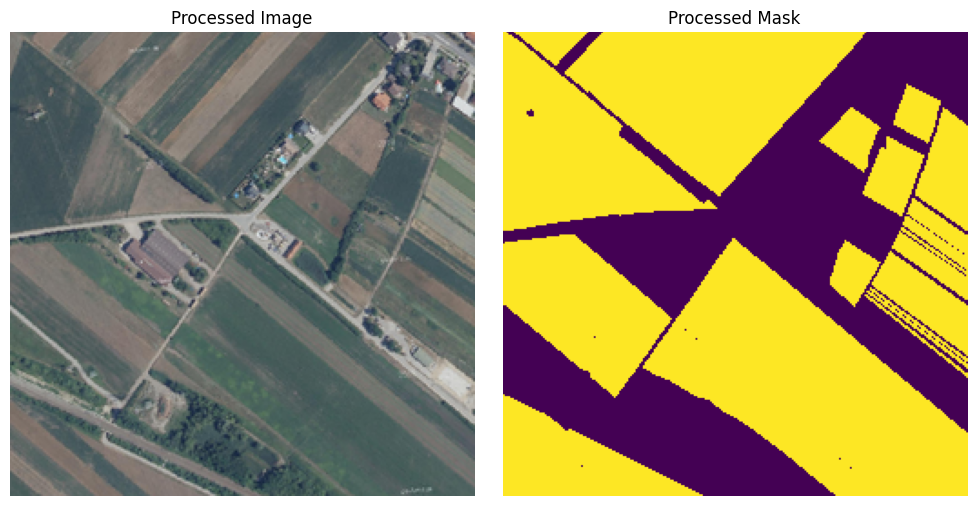

In [145]:
#preprocess test data
target_shape_img = [256, 256, 3]
target_shape_mask = [256, 256, 1]


if 'img_val' in locals() and 'mask_val' in locals() and img_val and mask_val:
    X_test, y_test = PreprocessData(img_val, mask_val, target_shape_img, target_shape_mask)

    if X_test.size > 0 and y_test.size > 0 :
        total_pixels = y_test.size
        unique_classes, counts = np.unique(y_train, return_counts=True)
        print("\nClass distribution in y_test (after resizing):")
        for cls, count in zip(unique_classes, counts):
            percentage = (count / total_pixels) * 100
            print(f"  Class {cls}: {count} pixels ({percentage:.2f}%)")

        print("\nProcessed Shapes:")
        print("X_val Shape:", X_val.shape)
        print("y_test shape:", y_test.shape)

        image_index = 4
        print(f"\nVisualizing processed example index {image_index}:")
        fig, arr = plt.subplots(1, 2, figsize=(10, 5))

        arr[0].imshow(X_test[image_index])
        arr[0].set_title('Processed Image')
        arr[0].axis('off')

        arr[1].imshow(np.squeeze(y_test[image_index]), cmap='viridis')
        arr[1].set_title('Processed Mask')
        arr[1].axis('off')

        plt.tight_layout()
        plt.show()
    else:
        print("\nPreprocessing resulted in empty arrays. Check logs for errors.")
else:
    print("\nVariables 'img' and 'mask' not found or are empty. Run LoadAndProcessData first.")


## Evaluation on test data

Model shows decent result

In [180]:
with tf.device('/device:GPU:0'):
  unetv1 = tf.keras.models.load_model('./unet_basic_v1_256.keras', custom_objects={"SegF1": SegF1})
  result_eval = unetv1.evaluate(X_test, y_test)

36/36 ━━━━━━━━━━━━━━━━━━━━ 9s 148ms/step - accuracy: 0.8613 - crop_iou: 0.6930 - loss: 0.3529 - macro_f1: 0.8180


In [149]:
print(result_eval)

[0.3157689571380615, 0.8789417147636414, 0.7299330234527588, 0.8438858985900879]


In [147]:
# Results of Validation Dataset
def VisualizeResults(index):
    img = X_test[index]
    img = img[np.newaxis, ...]
    pred_y = unet.predict(img)
    pred_mask = tf.argmax(pred_y[0], axis=-1)
    pred_mask = pred_mask[..., tf.newaxis]
    fig, arr = plt.subplots(1, 3, figsize=(15, 15))
    arr[0].imshow(X_test[index])
    arr[0].set_title('Processed Image')
    arr[1].imshow(y_test[index,:,:,0])
    arr[1].set_title('Actual Masked Image ')
    arr[2].imshow(pred_mask[:,:,0])
    arr[2].set_title('Predicted Masked Image ')

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


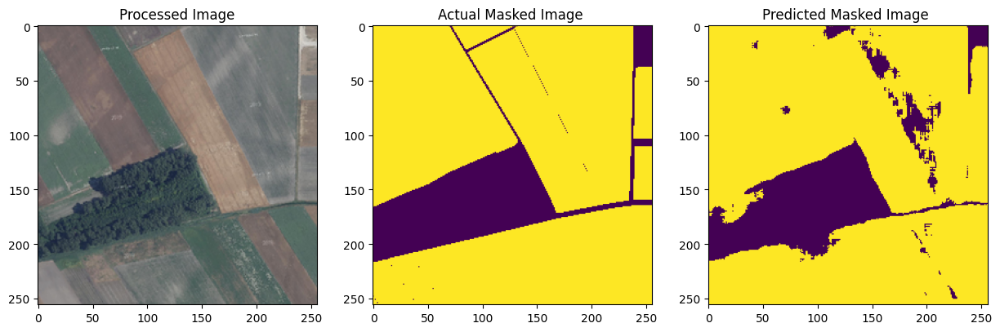

In [ ]:
index = 5
VisualizeResults(index)

### Saving model
Now save model for future use

In [174]:
save_path = './unet_basic_v1_256-bad.keras'

unet.save(save_path)

In [175]:
!ls -la ./

total 6110536
drwxr-xr-x 1 root root       4096 May 16 13:57 .
drwxr-xr-x 1 root root       4096 May 16 09:12 ..
drwxr-xr-x 4 root root       4096 May 14 13:38 .config
drwx------ 7 root root       4096 May 16 09:13 drive
drwxrwxr-x 5 root root       4096 Sep 30  2022 images
drwxrwxr-x 5 root root       4096 Sep 30  2022 masks
-rw------- 1 root root 6049340023 May 16 09:16 orthos.zip
drwxr-xr-x 1 root root       4096 May 14 13:38 sample_data
-rw-r--r-- 1 root root  103907086 May 16 14:06 unet_basic_v1_256-bad.keras
-rw-r--r-- 1 root root  103907080 May 16 13:27 unet_basic_v1_256.keras


In [176]:
!cp ./unet_basic_v1_256-bad.keras ./drive/MyDrive/dissertation/unet_basic_v1_256-bad.keras

In [169]:
!ls -la ./drive/MyDrive/dissertation/

total 509407
drwx------ 2 root root      4096 Apr 22 20:39 datasets
-rw------- 1 root root    823297 May 10 16:49 step1.unet-training-datsset1.ipynb.ipynb
-rw------- 1 root root   1271349 May 11 09:46 step2.unet-evaluate-dataset2.ipynb
-rw------- 1 root root 103907086 May 16 14:03 unet_basic_v1_256-bad.keras
-rw------- 1 root root 103907080 May 16 13:27 unet_basic_v1_256.keras
-rw------- 1 root root 103906735 May  4 13:19 unet_basic_v1.keras
-rw------- 1 root root 103905329 May 11 09:36 unet_basic_v2.keras
-rw------- 1 root root 103905302 May 11 20:19 unet_basic_v3.keras
